<a href="https://colab.research.google.com/github/unclepete-20/lab4-sds/blob/main/lab4_sds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Laboratorio 4: Familias de Malware**

## Integrantes:
- Pedro Arriola (20188)
- Oscar Lopez (20679)

In [ ]:
%pip install pefile

### Analisis estatico de Malware

In [ ]:
import os
import pandas as pd
import pefile

# Función para extraer características de un archivo PE
def extract_pe_features(file_path):
    pe_features = {}

    # Abrir el archivo PE
    try:
        pe = pefile.PE(file_path)
    except pefile.PEFormatError:
        return None

    # PE Header
    pe_features['Machine'] = pe.FILE_HEADER.Machine
    pe_features['NumberOfSections'] = pe.FILE_HEADER.NumberOfSections
    pe_features['TimeDateStamp'] = pe.FILE_HEADER.TimeDateStamp
    pe_features['PointerToSymbolTable'] = pe.FILE_HEADER.PointerToSymbolTable
    # Agregar más características del PE header según sea necesario

    # Secciones
    section_names = [section.Name.decode().strip('\x00') for section in pe.sections]
    pe_features['SectionNames'] = ';'.join(section_names)

    # Imports
    if hasattr(pe, 'DIRECTORY_ENTRY_IMPORT'):
        imports = [entry.dll.decode() for entry in pe.DIRECTORY_ENTRY_IMPORT]
        pe_features['Imports'] = ';'.join(imports)
    else:
        pe_features['Imports'] = None

    # Otros análisis estáticos que desees realizar

    return pe_features

# Directorio que contiene los archivos de malware
malware_dir = '/content/drive/MyDrive/MALWR'

# Lista para almacenar las características de todos los archivos
data = []

# Recorrer los archivos en el directorio de malware
for filename in os.listdir(malware_dir):
    file_path = os.path.join(malware_dir, filename)
    if os.path.isfile(file_path):
        # Extraer características del archivo PE
        pe_features = extract_pe_features(file_path)
        if pe_features is not None:
            pe_features['Filename'] = filename
            data.append(pe_features)

# Convertir la lista de diccionarios a un DataFrame de Pandas
df = pd.DataFrame(data)

# Guardar el DataFrame como un archivo CSV
df.to_csv('malware_dataset.csv', index=False)

### Exploración y pre procesamiento de datos

In [ ]:
# Leer el dataset desde el archivo CSV
df = pd.read_csv('malware_dataset.csv')

# Mostrar las primeras filas del dataset
print("Primeras filas del dataset:")
print(df.head())

# Resumen estadístico de las características numéricas
print("\nResumen estadístico de las características numéricas:")
print(df.describe())

# Tipos de datos de cada columna
print("\nTipos de datos de cada columna:")
print(df.dtypes)

# Número de filas y columnas en el dataset
print("\nDimensiones del dataset:")
print(df.shape)

# Mostrar algunas estadísticas adicionales
print("\nNúmero de secciones máximo:")
print(df['NumberOfSections'].max())

print("\nNúmero de secciones mínimo:")
print(df['NumberOfSections'].min())

print("\nCantidad de muestras únicas de máquinas:")
print(df['Machine'].nunique())

# Explorar las primeras secciones de cada muestra
print("\nPrimeras secciones de cada muestra:")
for index, row in df.iterrows():
    print(f"\nMuestra: {row['Filename']}")
    print(row['SectionNames'].split(';')[0])  # Mostrar solo la primera sección para simplificar la visualización

# Explorar las primeras funciones importadas de cada muestra
print("\nPrimeras funciones importadas de cada muestra:")
for index, row in df.iterrows():
    print(f"\nMuestra: {row['Filename']}")
    if row['Imports']:
        print(row['Imports'].split(';')[:5])  # Mostrar solo las primeras 5 funciones importadas para simplificar la visualización
    else:
        print("No hay información de importaciones para esta muestra.")

Primeras filas del dataset:
   Machine  NumberOfSections  TimeDateStamp  PointerToSymbolTable  \
0      332                 3     1313068549                     0   
1      332                 3     1285661381                     0   
2      332                 4     1313723257                     0   
3      332                 3     1306744169                     0   
4      332                 3     1285661381                     0   

               SectionNames  \
0        .text;.rdata;.data   
1        .text;.rdata;.data   
2  .text;.rdata;.data;.rsrc   
3           UPX0;UPX1;.rsrc   
4        .text;.rdata;.data   

                                             Imports  \
0  KERNEL32.dll;USER32.dll;ADVAPI32.dll;SHELL32.d...   
1  KERNEL32.dll;USER32.dll;ADVAPI32.dll;SHELL32.d...   
2  KERNEL32.dll;USER32.dll;ADVAPI32.dll;MSVCRT.dl...   
3  KERNEL32.DLL;MSVCRT.dll;SHELL32.dll;WININET.dl...   
4  KERNEL32.dll;USER32.dll;ADVAPI32.dll;SHELL32.d...   

                                F

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Columnas categóricas y numéricas
categorical_cols = ['SectionNames', 'Imports']
numeric_cols = ['Machine', 'NumberOfSections', 'TimeDateStamp', 'PointerToSymbolTable']

# Preprocesamiento de columnas
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),  # Escalado de características numéricas
        ('cat', OneHotEncoder(), categorical_cols)  # Codificación one-hot de características categóricas
    ])

# Definir el pipeline completo
pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

# Aplicar el preprocesamiento al DataFrame
df_preprocessed = pipeline.fit_transform(df)

# Convertir el resultado a un nuevo DataFrame
df_preprocessed = pd.DataFrame(df_preprocessed)

# Agregar el nombre de las columnas al DataFrame preprocesado
column_names = numeric_cols + list(pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out())
df_preprocessed.columns = column_names

# Mostrar el DataFrame preprocesado
print(df_preprocessed.head())

   Machine  NumberOfSections  TimeDateStamp  PointerToSymbolTable  \
0      0.0         -0.160128       1.302200                   0.0   
1      0.0         -0.160128       0.501790                   0.0   
2      0.0          6.244998       1.321321                   0.0   
3      0.0         -0.160128       1.117501                   0.0   
4      0.0         -0.160128       0.501790                   0.0   

   SectionNames_.text;.rdata;.data  SectionNames_.text;.rdata;.data;.rsrc  \
0                              1.0                                    0.0   
1                              1.0                                    0.0   
2                              0.0                                    1.0   
3                              0.0                                    0.0   
4                              1.0                                    0.0   

   SectionNames_UPX0;UPX1;.rsrc  SectionNames_UPX0;UPX1;UPX2  \
0                           0.0                          0

In [ ]:
df_preprocessed

,Machine,NumberOfSections,TimeDateStamp,PointerToSymbolTable,SectionNames_.text;.rdata;.data,SectionNames_.text;.rdata;.data;.rsrc,SectionNames_UPX0;UPX1;.rsrc,SectionNames_UPX0;UPX1;UPX2,Imports_ADVAPI32.dll;GDI32.dll;KERNEL32.DLL;MSVCRT.dll;NETAPI32.dll;PSAPI.DLL;USER32.dll;WS2_32.dll,Imports_ADVAPI32.dll;GDI32.dll;KERNEL32.DLL;MSVCRT.dll;NETAPI32.dll;ntdll.dll;PSAPI.DLL;USER32.dll;WS2_32.dll,Imports_ADVAPI32.dll;GDI32.dll;KERNEL32.DLL;MSVCRT.dll;NETAPI32.dll;ntdll.dll;USER32.dll;WS2_32.dll,Imports_KERNEL32.DLL;MSVCRT.dll;SHELL32.dll;USER32.dll;WS2_32.dll,Imports_KERNEL32.DLL;MSVCRT.dll;SHELL32.dll;WININET.dll;WS2_32.dll,Imports_KERNEL32.DLL;MSVCRT.dll;USER32.dll;WS2_32.dll,Imports_KERNEL32.dll;USER32.dll;ADVAPI32.dll;MSVCRT.dll;WININET.dll;WS2_32.dll,Imports_KERNEL32.dll;USER32.dll;ADVAPI32.dll;SHELL32.dll;MSVCRT.dll;WININET.dll;WS2_32.dll
0,0.0,-0.160128,1.302200,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,6.244998,1.321321,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,-0.160128,1.117501,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0.0,-0.160128,1.117501,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,0.0,-0.160128,1.296628,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,0.0,-0.160128,1.117501,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


### Implementacion del modelo

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

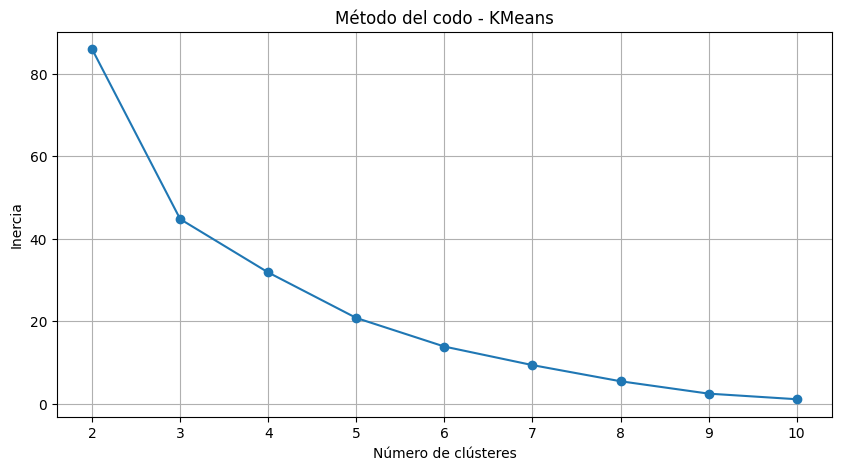

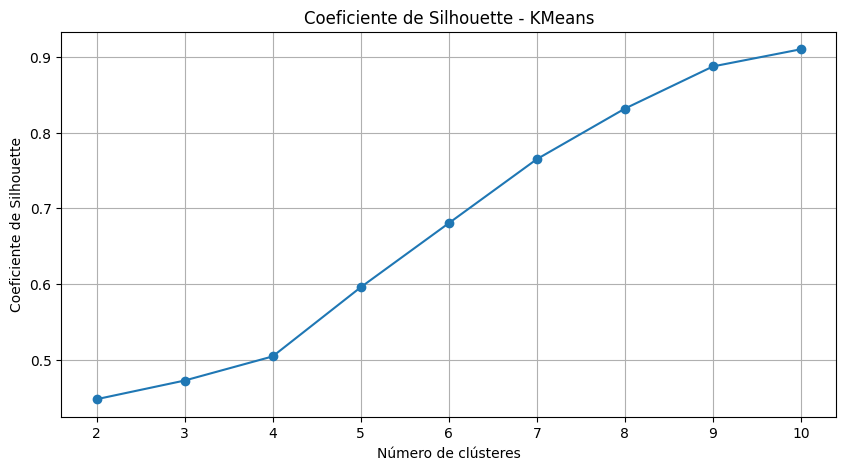

Número óptimo de clústeres según método del codo para KMeans: 3
Número óptimo de clústeres según coeficiente de Silhouette para KMeans: 10


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Número óptimo de clústeres según DBSCAN: 2
Coeficiente de Silhouette para DBSCAN: 0.3141150458863966
   Machine  NumberOfSections  TimeDateStamp  PointerToSymbolTable  \
0      0.0         -0.160128       1.302200                   0.0   
1      0.0         -0.160128       0.501790                   0.0   
2      0.0          6.244998       1.321321                   0.0   
3      0.0         -0.160128       1.117501                   0.0   
4      0.0         -0.160128       0.501790                   0.0   

   SectionNames_.text;.rdata;.data  SectionNames_.text;.rdata;.data;.rsrc  \
0                              1.0                                    0.0   
1                              1.0                                    0.0   
2                              0.0                                    1.0   
3                              0.0                                    0.0   
4                              1.0                                    0.0   

   SectionNames_UPX0;

In [ ]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Definir el rango de valores de K
k_range = range(2, 11)  # Empezamos con 2 clústeres y vamos hasta 10

# Inicializar listas para almacenar los valores de inercia y coeficiente de silhouette
inertia_values = []
silhouette_scores_kmeans = []

# Entrenar el modelo K-means para diferentes valores de K y calcular la inercia y el coeficiente de silhouette
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_preprocessed)  # Utilizamos el DataFrame preprocesado
    inertia_values.append(kmeans.inertia_)
    if k > 1:  # Calculamos el coeficiente de silhouette solo si tenemos más de un clúster
        silhouette_scores_kmeans.append(silhouette_score(df_preprocessed, kmeans.labels_))

# Graficar el método del codo (inercia vs. número de clústeres)
plt.figure(figsize=(10, 5))
plt.plot(k_range, inertia_values, marker='o')
plt.xlabel('Número de clústeres')
plt.ylabel('Inercia')
plt.title('Método del codo - KMeans')
plt.grid(True)
plt.show()

# Graficar el coeficiente de silhouette vs. número de clústeres para K-means
plt.figure(figsize=(10, 5))
plt.plot(range(2, len(silhouette_scores_kmeans) + 2), silhouette_scores_kmeans, marker='o')
plt.xlabel('Número de clústeres')
plt.ylabel('Coeficiente de Silhouette')
plt.title('Coeficiente de Silhouette - KMeans')
plt.grid(True)
plt.show()

# Basándonos en el método del codo y el coeficiente de Silhouette, seleccionamos el número óptimo de clústeres para KMeans
optimal_k_codo_kmeans = 3  # Seleccionamos el punto donde la inercia deja de disminuir significativamente
optimal_k_silhouette_kmeans = silhouette_scores_kmeans.index(max(silhouette_scores_kmeans)) + 2  # El índice del valor máximo del coeficiente de Silhouette
print(f"Número óptimo de clústeres según método del codo para KMeans: {optimal_k_codo_kmeans}")
print(f"Número óptimo de clústeres según coeficiente de Silhouette para KMeans: {optimal_k_silhouette_kmeans}")

# Entrenar el modelo K-means con el número óptimo de clústeres
kmeans_optimal = KMeans(n_clusters=optimal_k_silhouette_kmeans, random_state=42)
kmeans_optimal.fit(df_preprocessed)

# Etiquetar cada observación según el clúster indicado por el algoritmo K-means
df_preprocessed['Cluster_Labels_KMeans'] = kmeans_optimal.labels_

# Entrenar el modelo DBSCAN y encontrar el número óptimo de clústeres mediante el coeficiente de silhouette
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan.fit(df_preprocessed)
silhouette_score_dbscan = silhouette_score(df_preprocessed, dbscan.labels_)
n_clusters_dbscan = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)

# Etiquetar cada observación según el clúster indicado por DBSCAN
df_preprocessed['DBSCAN_Cluster_Labels'] = dbscan.labels_

# Mostrar el número óptimo de clústeres y el coeficiente de Silhouette para DBSCAN
print(f"Número óptimo de clústeres según DBSCAN: {n_clusters_dbscan}")
print(f"Coeficiente de Silhouette para DBSCAN: {silhouette_score_dbscan}")

In [ ]:
df_preprocessed

,Machine,NumberOfSections,TimeDateStamp,PointerToSymbolTable,SectionNames_.text;.rdata;.data,SectionNames_.text;.rdata;.data;.rsrc,SectionNames_UPX0;UPX1;.rsrc,SectionNames_UPX0;UPX1;UPX2,Imports_ADVAPI32.dll;GDI32.dll;KERNEL32.DLL;MSVCRT.dll;NETAPI32.dll;PSAPI.DLL;USER32.dll;WS2_32.dll,Imports_ADVAPI32.dll;GDI32.dll;KERNEL32.DLL;MSVCRT.dll;NETAPI32.dll;ntdll.dll;PSAPI.DLL;USER32.dll;WS2_32.dll,Imports_ADVAPI32.dll;GDI32.dll;KERNEL32.DLL;MSVCRT.dll;NETAPI32.dll;ntdll.dll;USER32.dll;WS2_32.dll,Imports_KERNEL32.DLL;MSVCRT.dll;SHELL32.dll;USER32.dll;WS2_32.dll,Imports_KERNEL32.DLL;MSVCRT.dll;SHELL32.dll;WININET.dll;WS2_32.dll,Imports_KERNEL32.DLL;MSVCRT.dll;USER32.dll;WS2_32.dll,Imports_KERNEL32.dll;USER32.dll;ADVAPI32.dll;MSVCRT.dll;WININET.dll;WS2_32.dll,Imports_KERNEL32.dll;USER32.dll;ADVAPI32.dll;SHELL32.dll;MSVCRT.dll;WININET.dll;WS2_32.dll,Cluster_Labels_KMeans,DBSCAN_Cluster_Labels
0,0.0,-0.160128,1.302200,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3,-1
1,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3,-1
2,0.0,6.244998,1.321321,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2,-1
3,0.0,-0.160128,1.117501,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5,-1
4,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3,-1
5,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3,-1
6,0.0,-0.160128,1.117501,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5,-1
7,0.0,-0.160128,1.296628,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3,-1
8,0.0,-0.160128,1.117501,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5,-1
9,0.0,-0.160128,0.501790,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3,-1


In [ ]:
# Obtener la cantidad de clústeres distintos identificados por KMeans y DBSCAN
n_clusters_kmeans = len(df_preprocessed['Cluster_Labels_KMeans'].unique())
n_clusters_dbscan = len(df_preprocessed['DBSCAN_Cluster_Labels'].unique())

# Mostrar la cantidad de clústeres identificados por cada algoritmo
print(f"Número de clústeres identificados por KMeans: {n_clusters_kmeans}")
print(f"Número de clústeres identificados por DBSCAN: {n_clusters_dbscan}")

# Comparar la cantidad de clústeres para estimar la cantidad de familias de malware detectadas
if n_clusters_kmeans == n_clusters_dbscan:
    print("Ambos algoritmos identificaron la misma cantidad de clústeres, lo que sugiere una posible coincidencia en las familias de malware detectadas.")
else:
    print("La cantidad de clústeres identificados por los algoritmos difiere, lo que sugiere que pueden haber diferencias en las familias de malware detectadas por cada algoritmo.")

Número de clústeres identificados por KMeans: 10
Número de clústeres identificados por DBSCAN: 3
La cantidad de clústeres identificados por los algoritmos difiere, lo que sugiere que pueden haber diferencias en las familias de malware detectadas por cada algoritmo.


In [ ]:
df_preprocessed.dtypes

Machine                                                                                                          float64
NumberOfSections                                                                                                 float64
TimeDateStamp                                                                                                    float64
PointerToSymbolTable                                                                                             float64
SectionNames_.text;.rdata;.data                                                                                  float64
SectionNames_.text;.rdata;.data;.rsrc                                                                            float64
SectionNames_UPX0;UPX1;.rsrc                                                                                     float64
SectionNames_UPX0;UPX1;UPX2                                                                                      float64
Imports_ADVAPI32.dll;GDI32.dll;K

### Analisis de similitud

Familia 1:


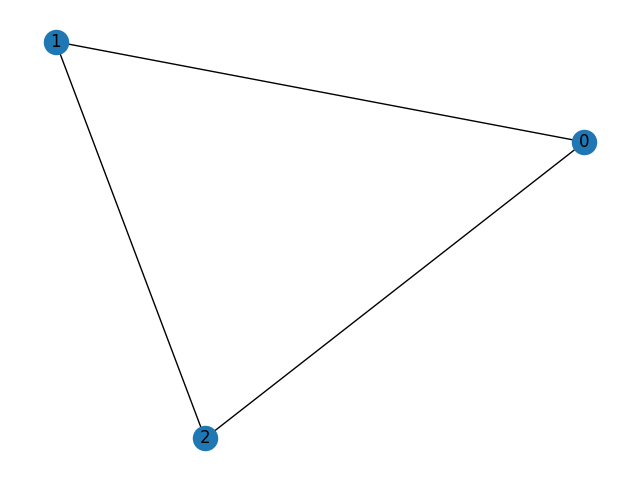

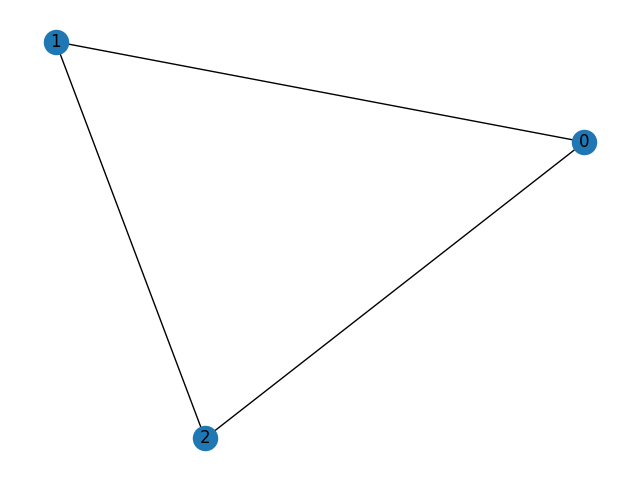

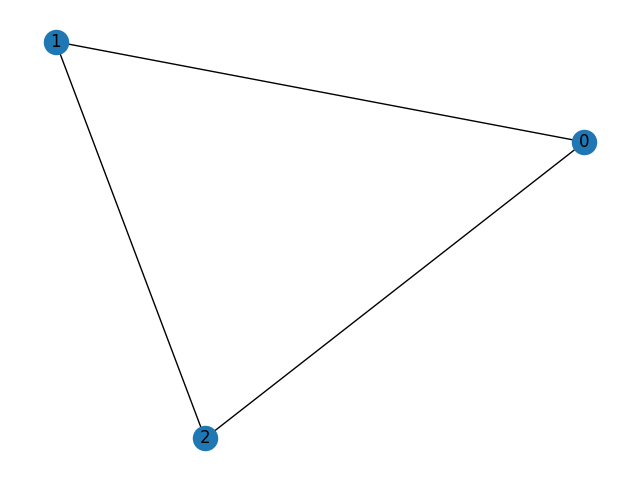

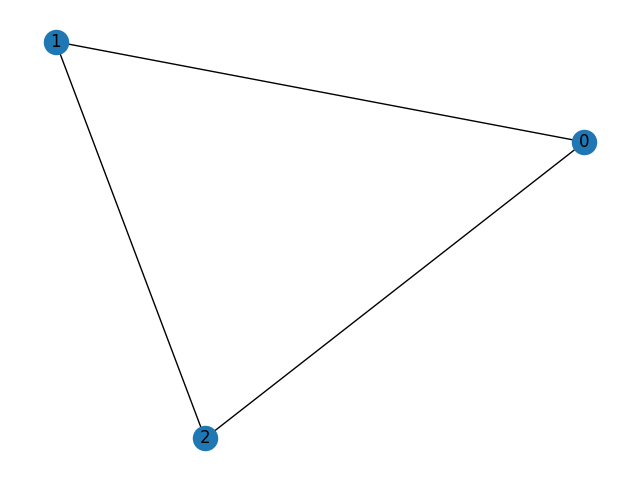

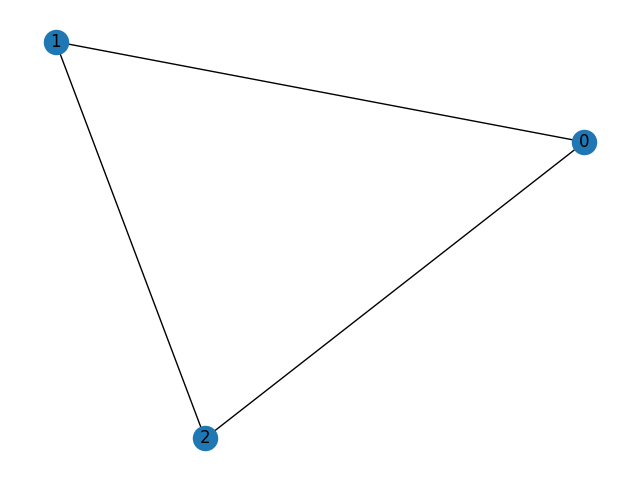

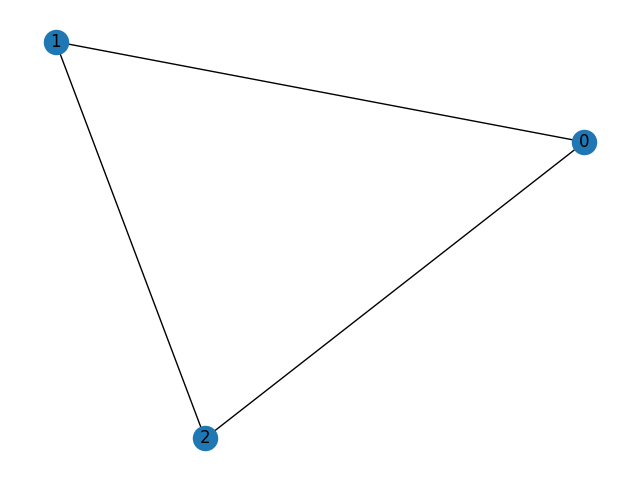

Familia 2:


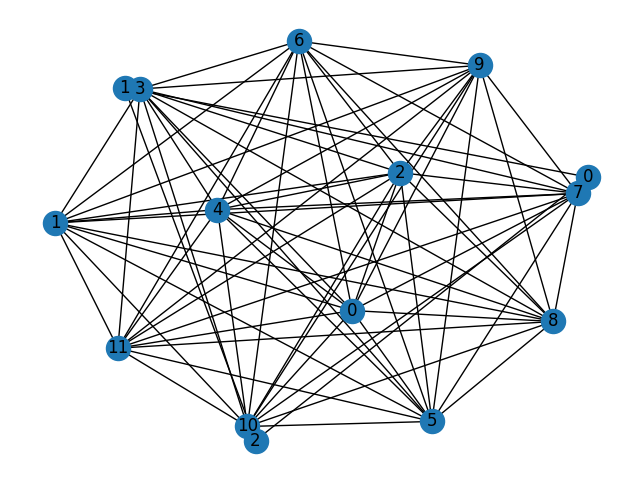

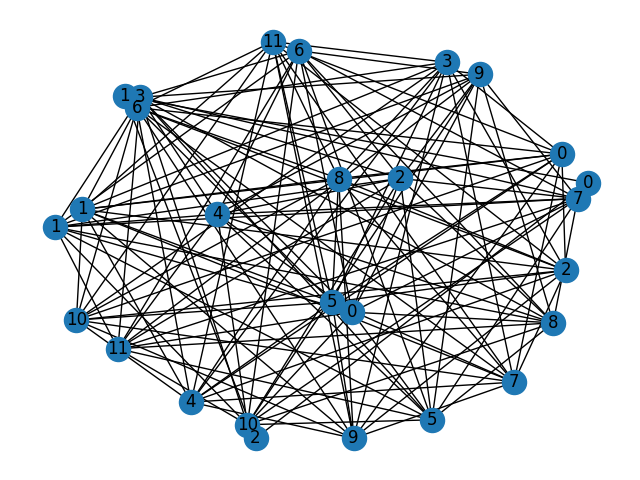

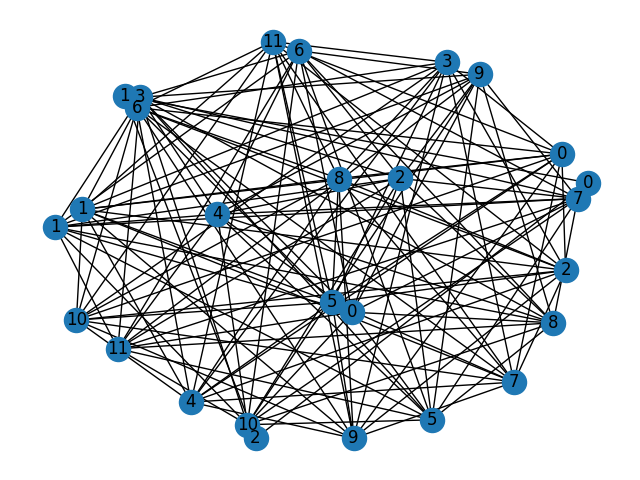

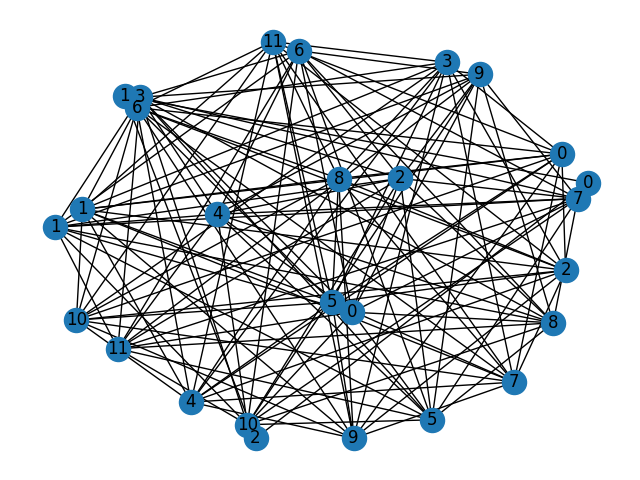

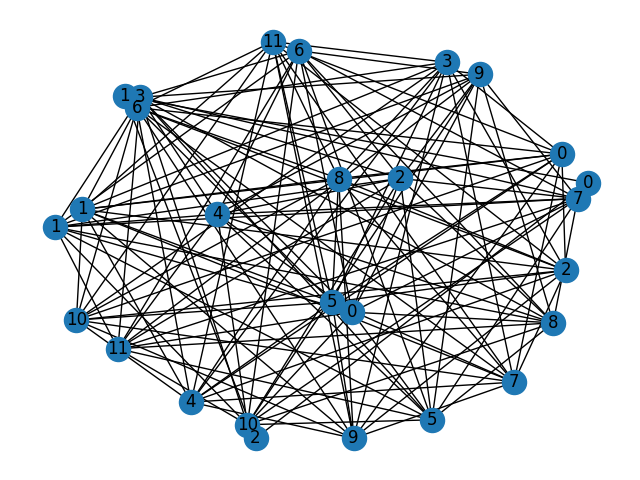

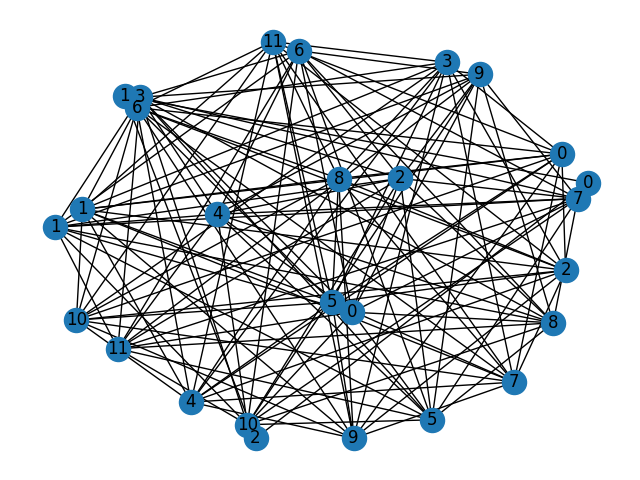

Familia 3:


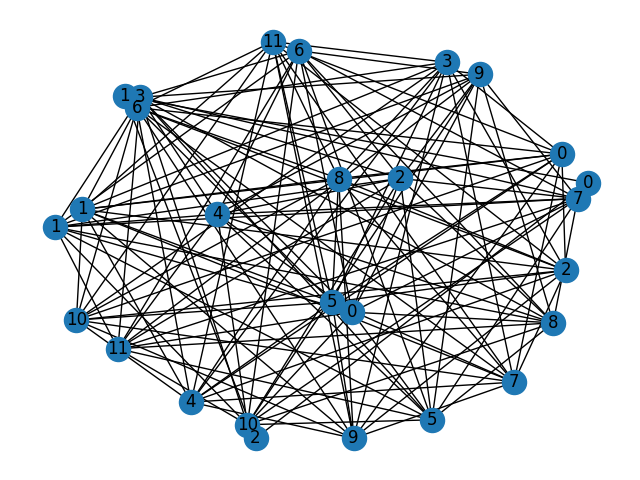

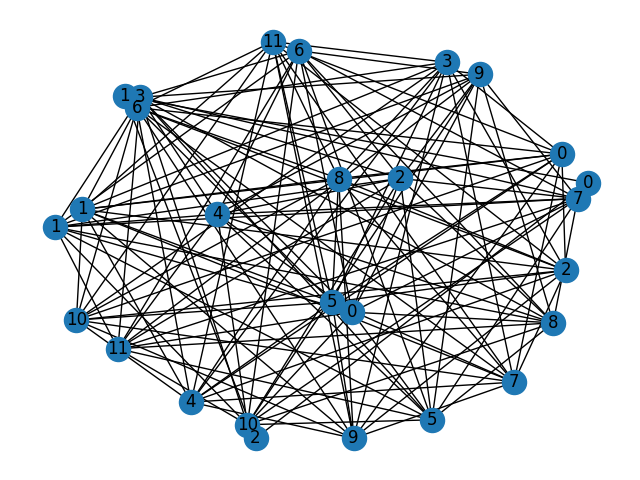

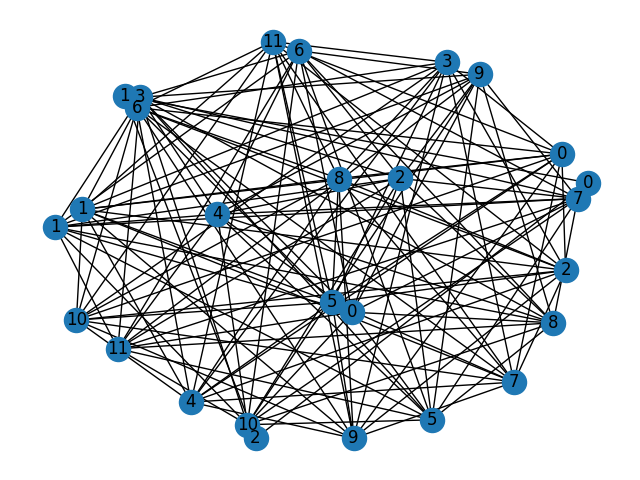

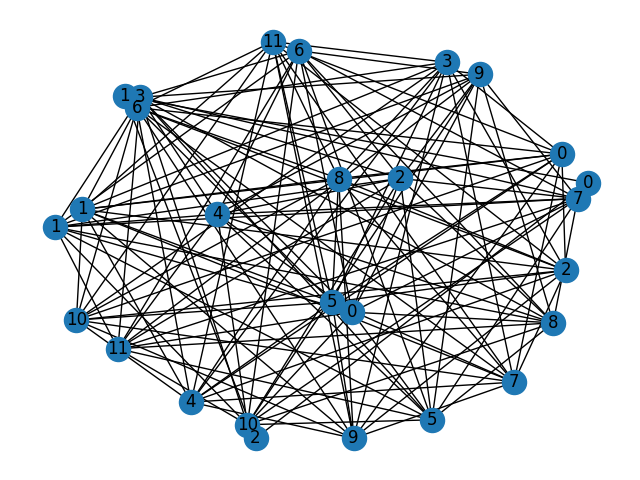

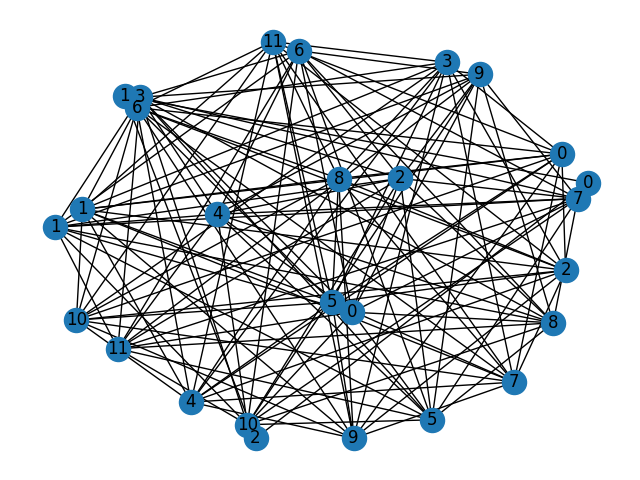

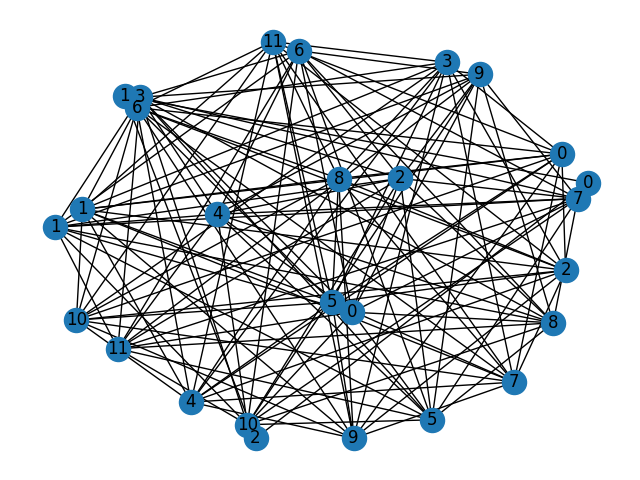

Familia 4:


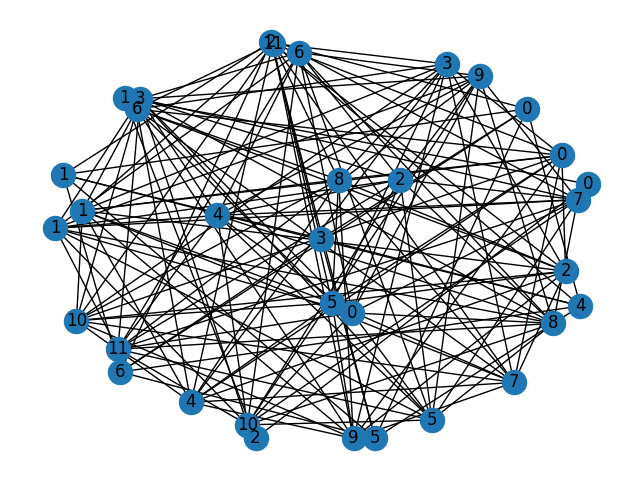

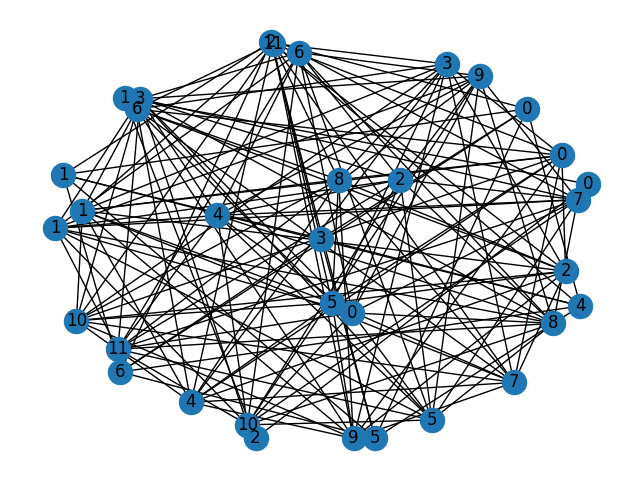

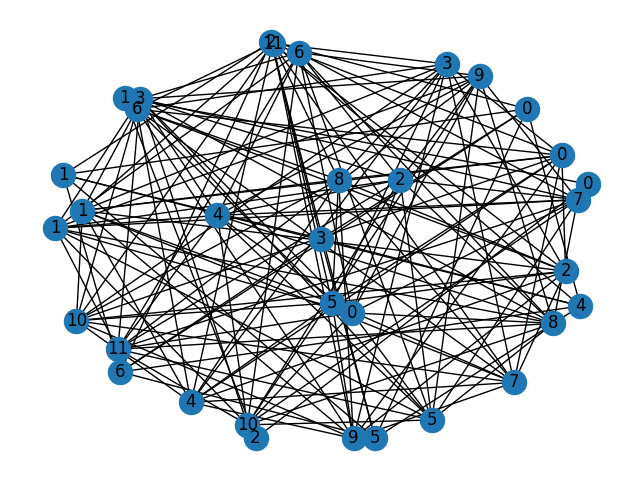

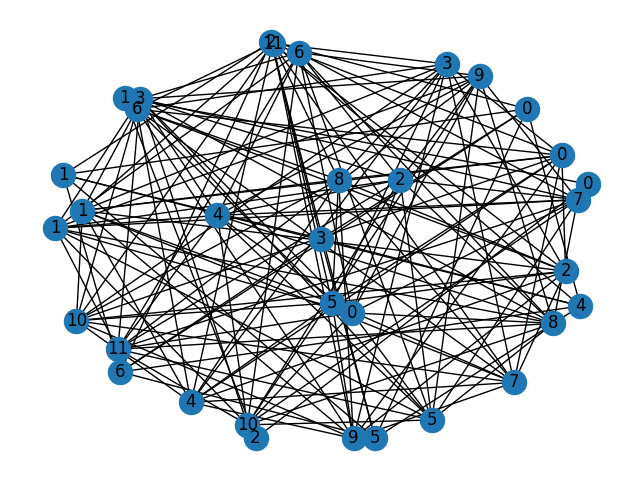

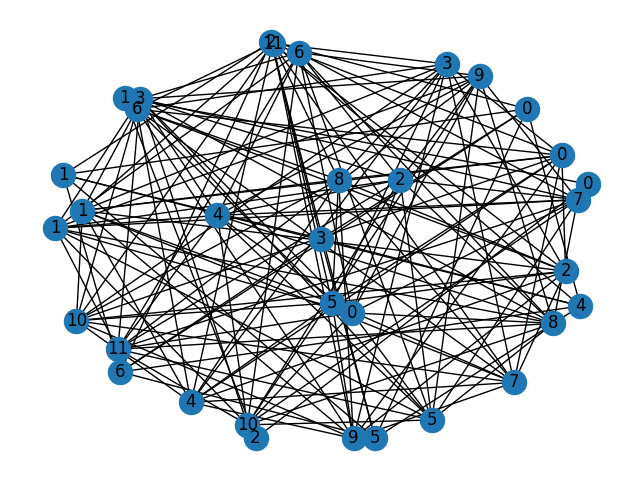

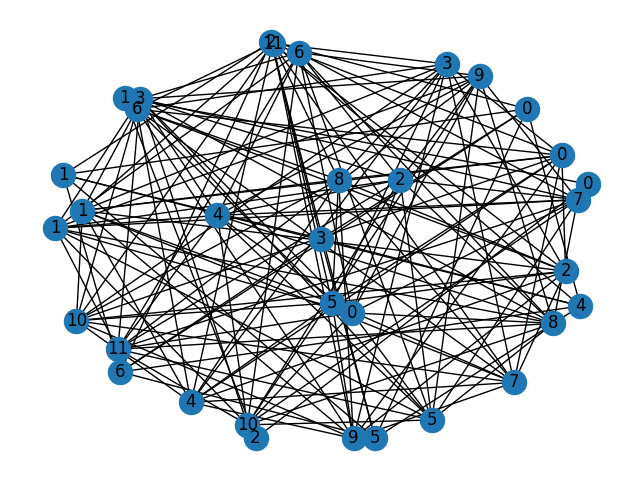

Familia 5:


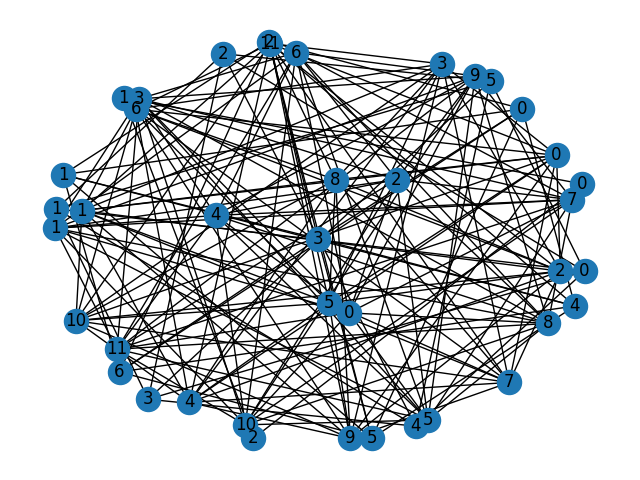

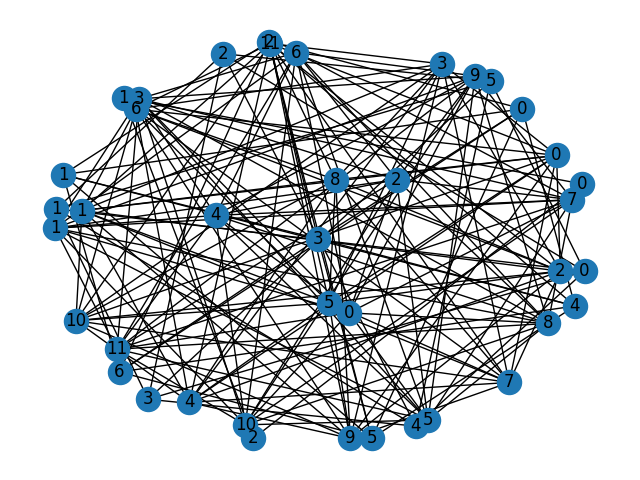

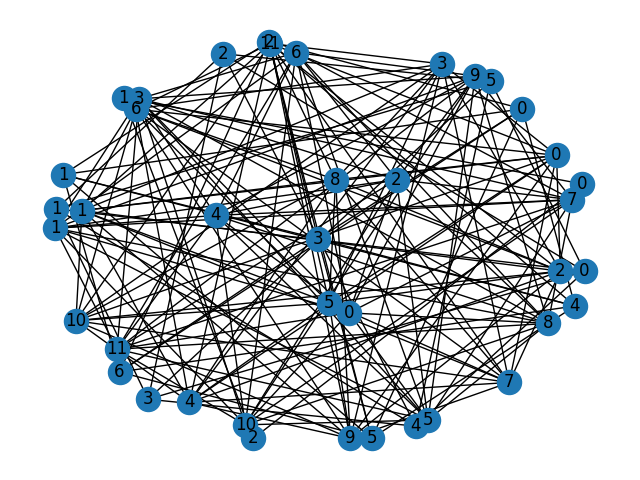

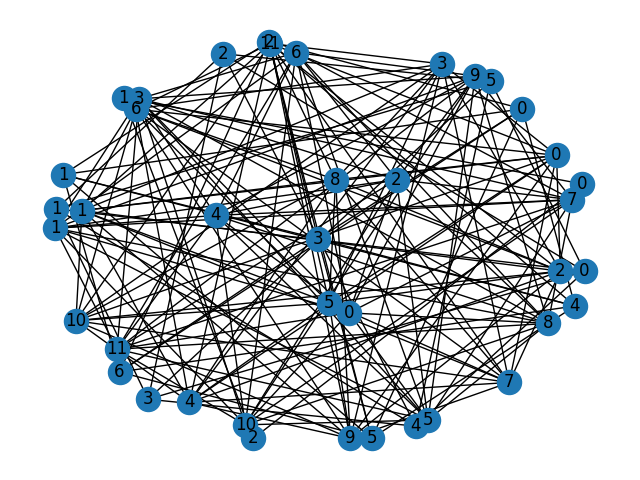

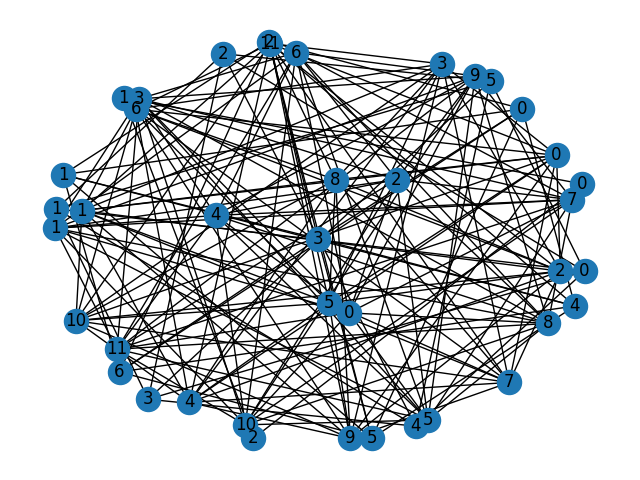

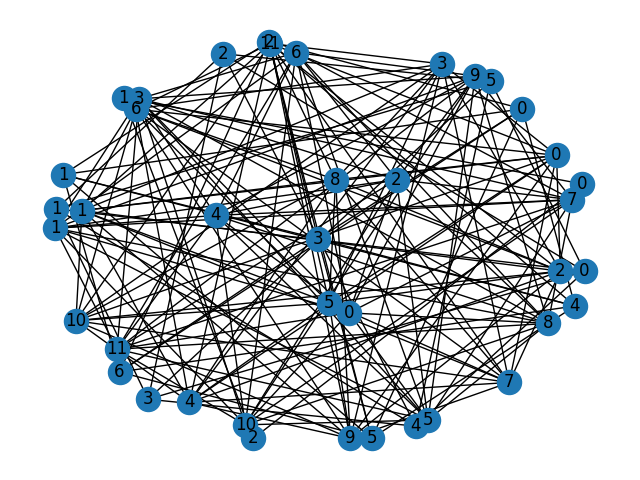

Familia 6:


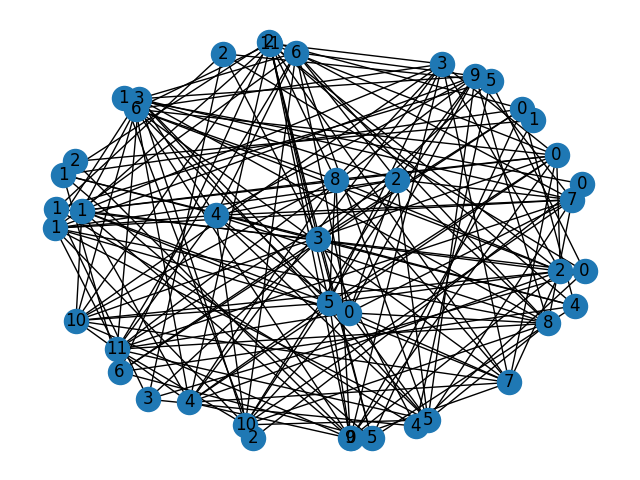

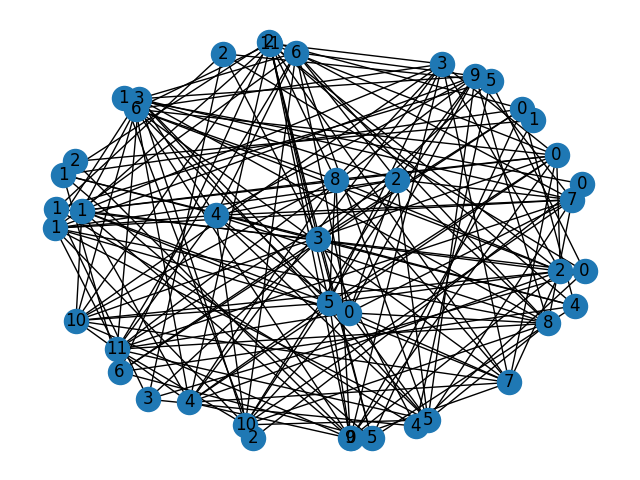

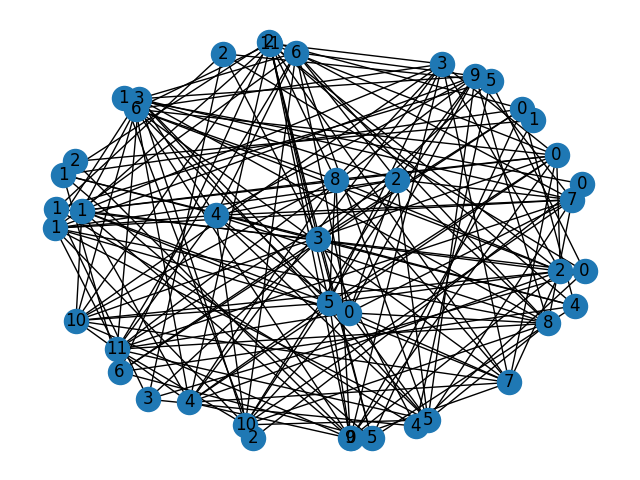

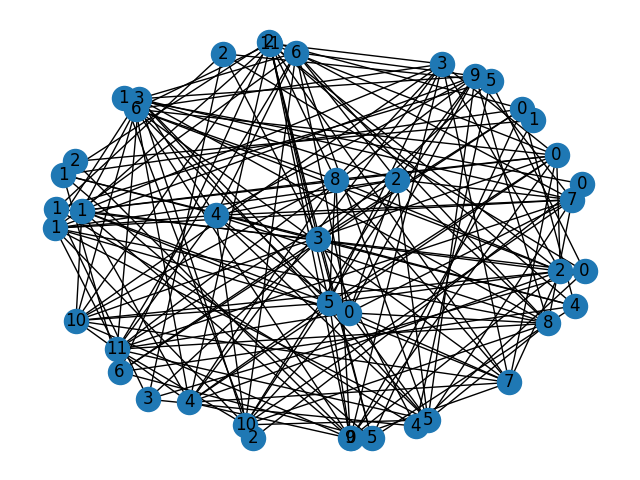

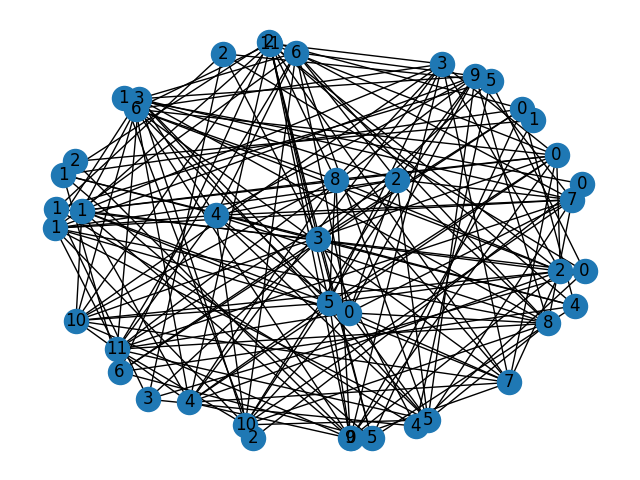

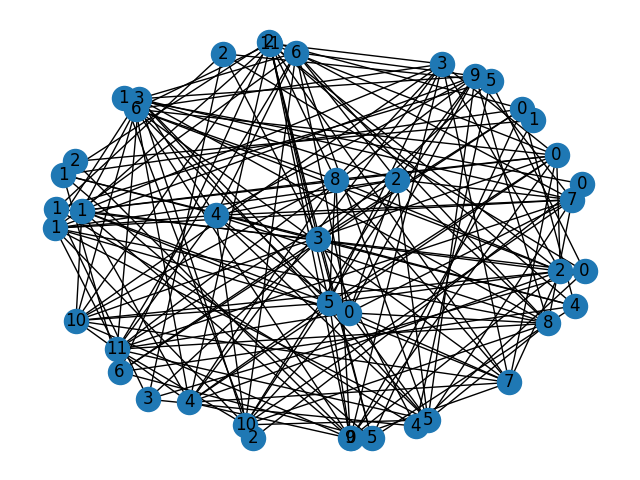

Familia 7:


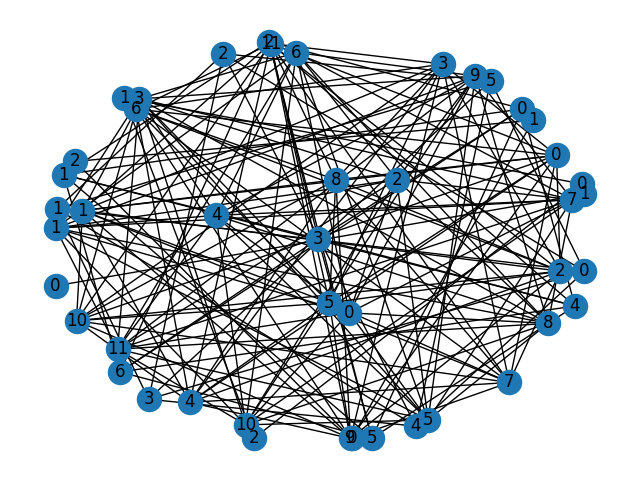

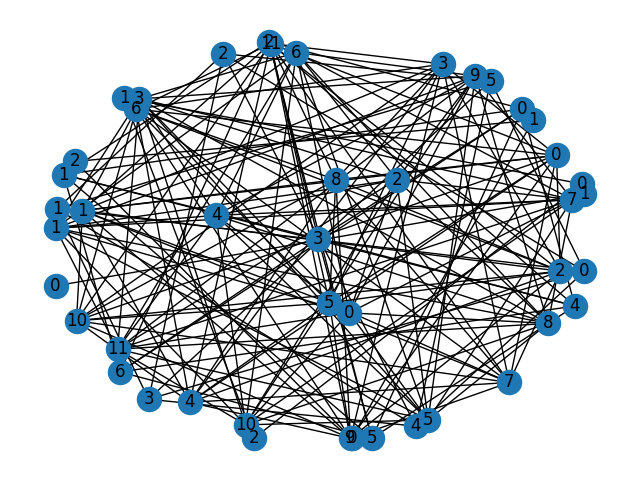

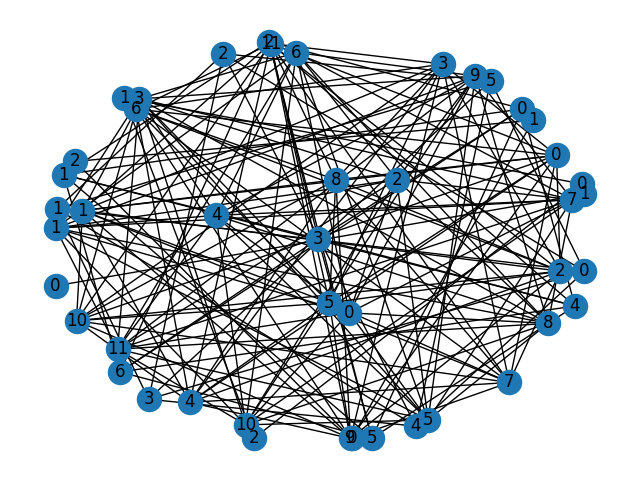

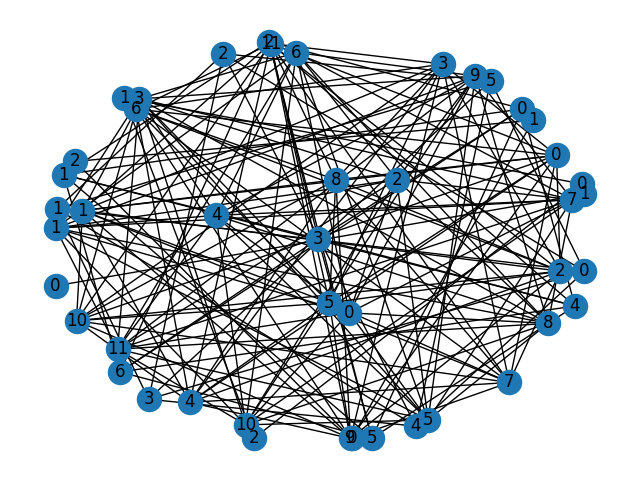

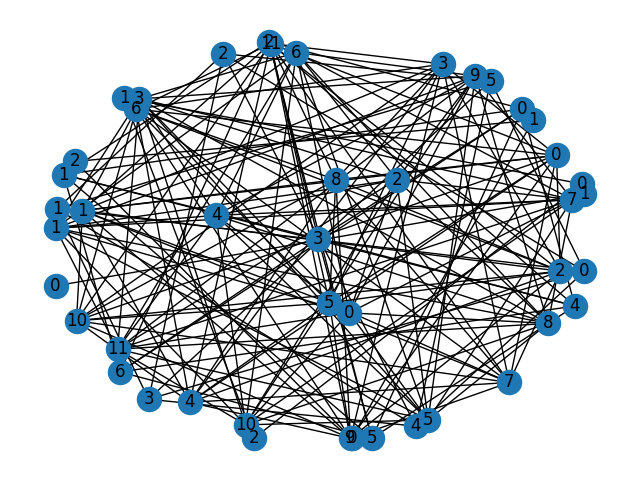

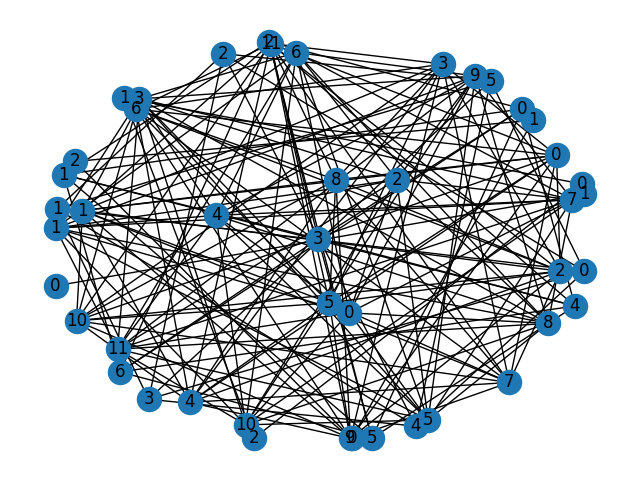

Familia 8:


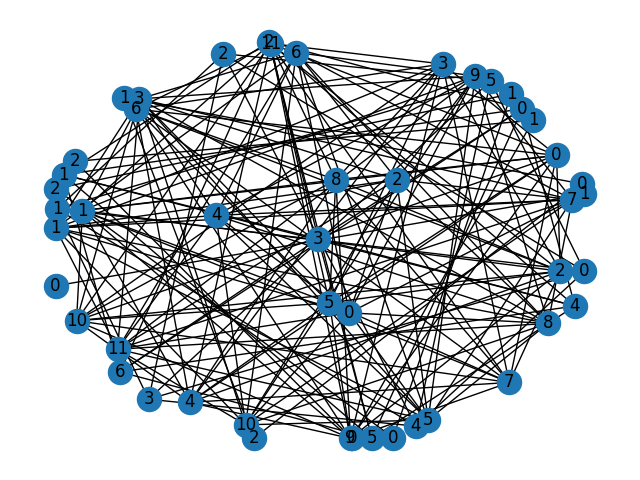

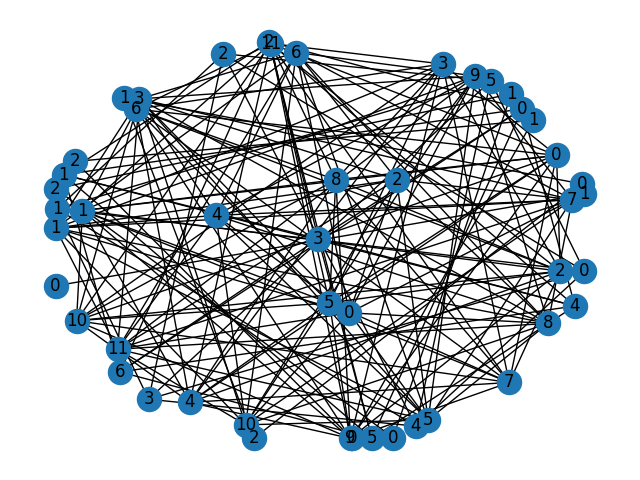

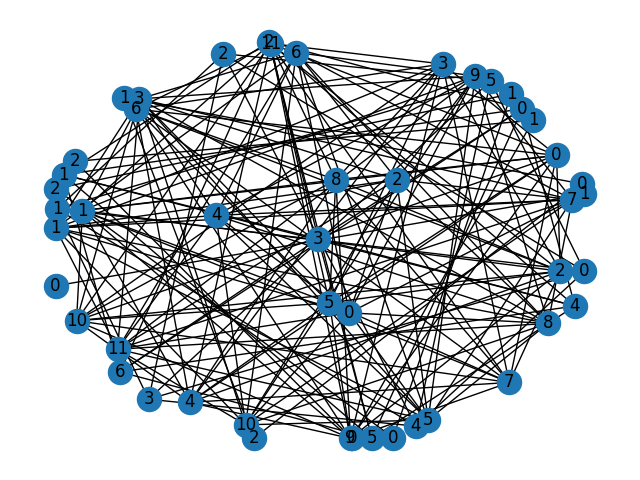

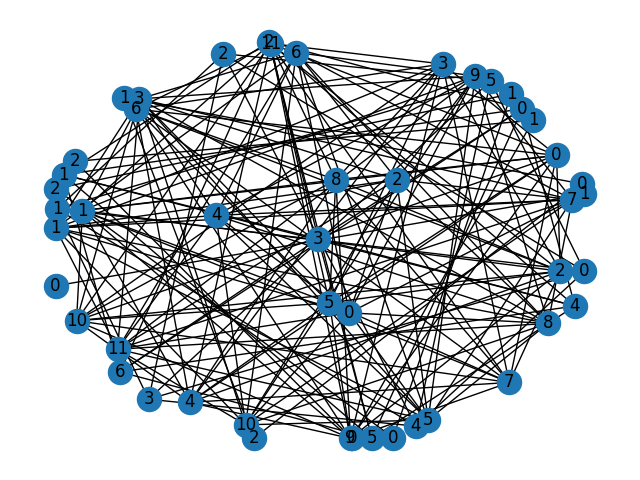

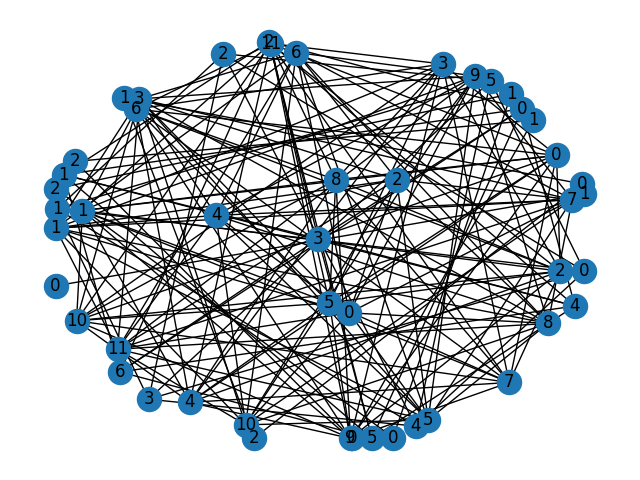

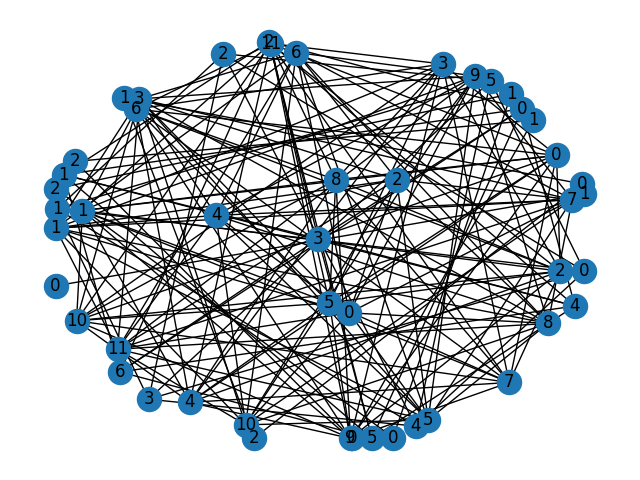

Familia 9:


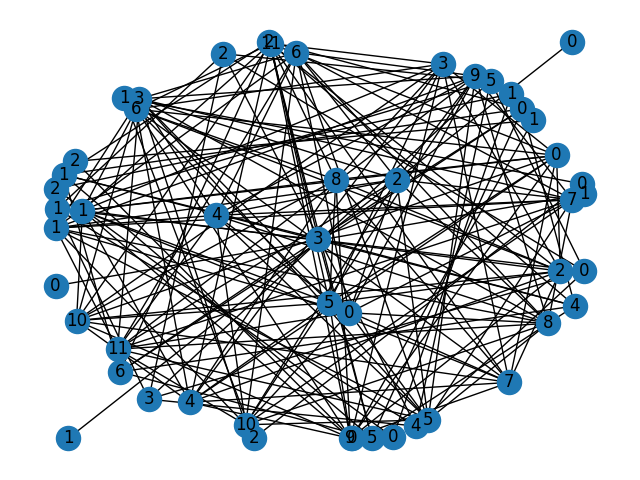

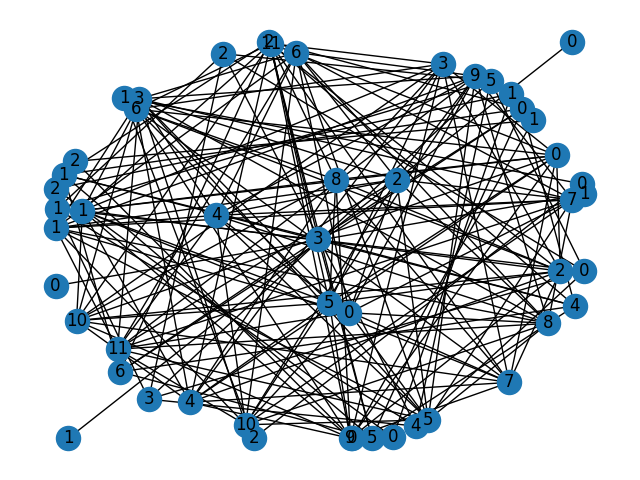

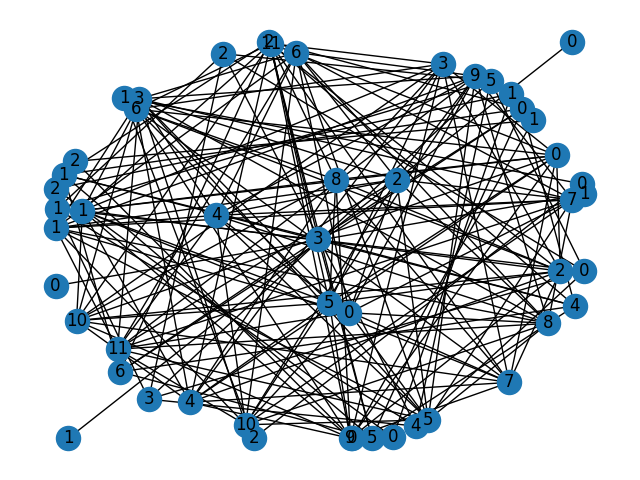

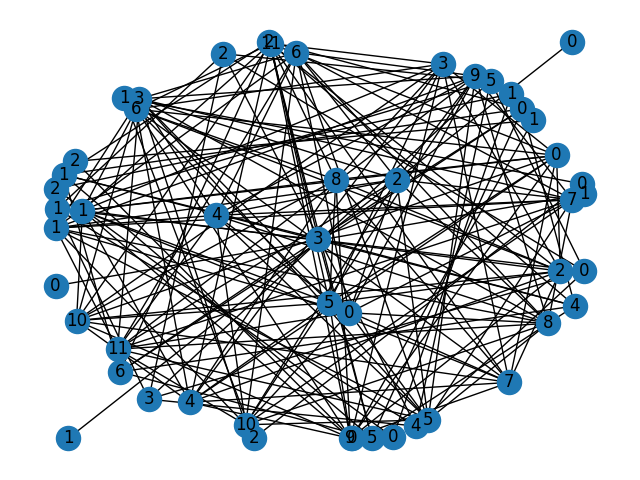

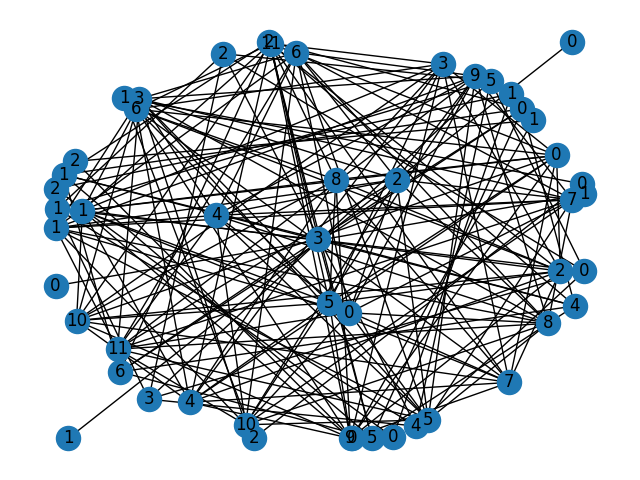

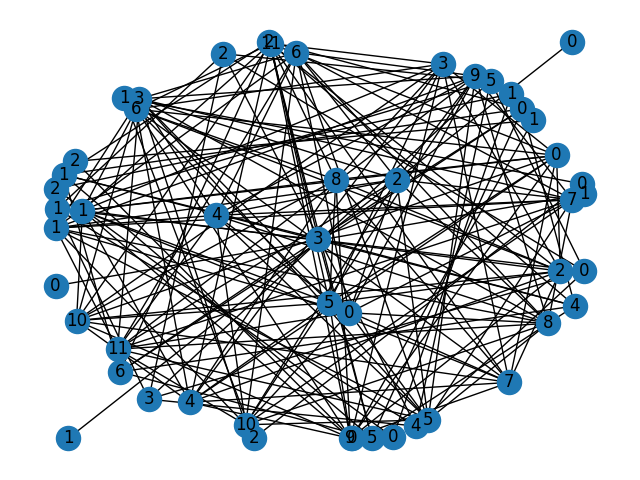

Familia 10:


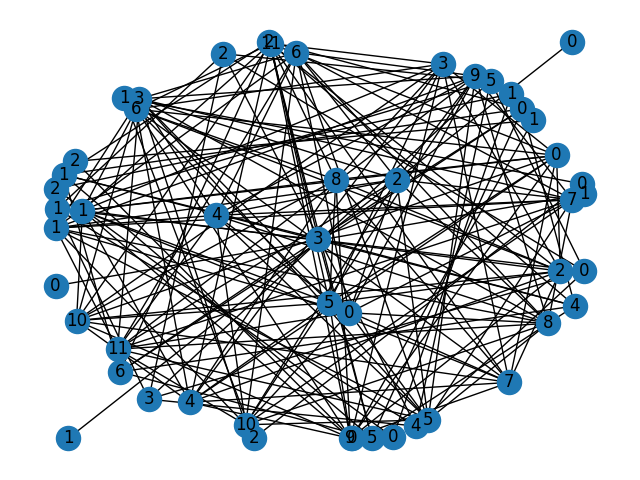

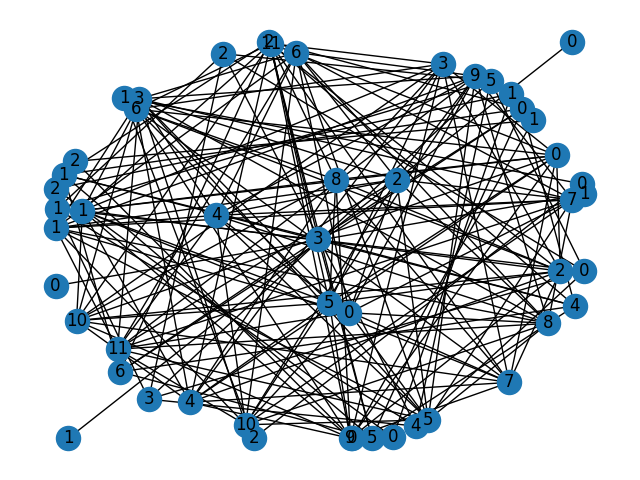

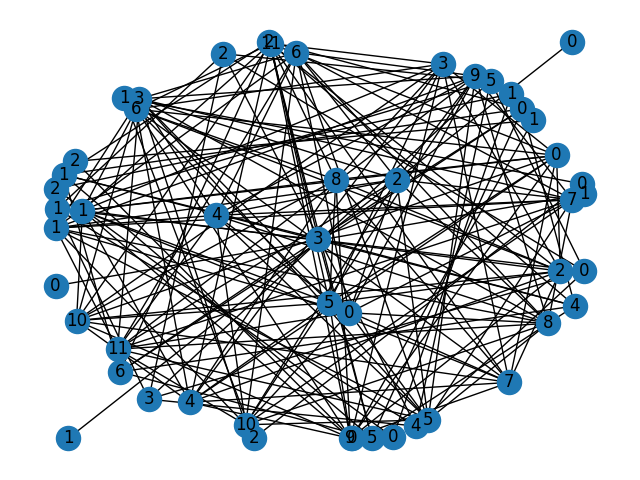

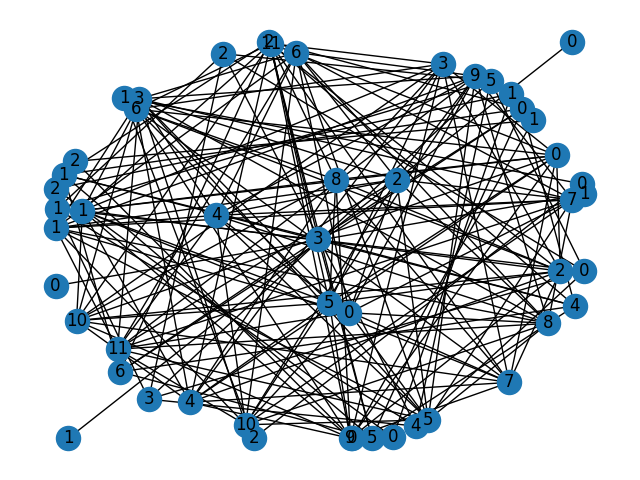

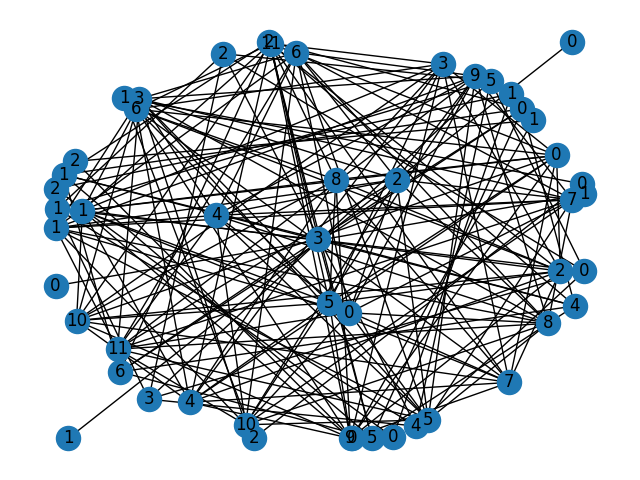

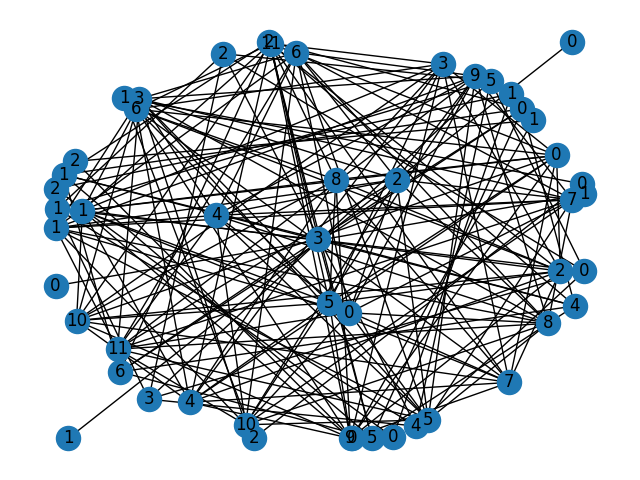

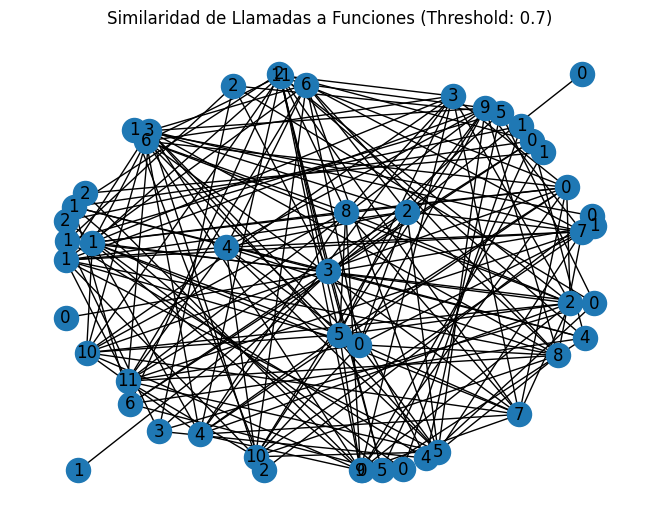

In [ ]:
from itertools import combinations
import networkx as nx
import numpy as np
from IPython.display import Image, display

# Función para calcular el índice de Jaccard entre dos conjuntos de strings o llamadas a funciones
def jaccard_similarity(set1, set2):
    set1 = set(set1)
    set2 = set(set2)
    intersection = len(np.intersect1d(set1, set2))
    union = len(set1) + len(set2) - intersection
    return intersection / union if union != 0 else 0

# Función para generar un grafo a partir de las muestras de malware y su similitud
def generate_similarity_graph(samples, threshold):
    G = nx.Graph()
    for i, sample1 in enumerate(samples):
        for j, sample2 in enumerate(samples):
            if i < j:  # Solo calculamos la similitud entre pares únicos
                similarity = jaccard_similarity(sample1, sample2)
                if similarity >= threshold:
                    G.add_edge(i, j, weight=similarity)
    return G

# Agrupar los ejemplos de malware por familia y obtener una lista de muestras para cada familia
malware_families = [group.values for _, group in df_preprocessed.groupby('Cluster_Labels_KMeans')[df_preprocessed.columns[4:]]]

# Calcular la similitud de strings y llamadas a funciones para cada familia
thresholds = [0.3, 0.5, 0.7]  # Umbrales de similitud
for i, family_samples in enumerate(malware_families):
    print(f"Familia {i + 1}:")
    for threshold in thresholds:
        # Calcular similitud de strings
        strings_sim_graph = generate_similarity_graph(family_samples[:, :4], threshold)  # Utilizamos las primeras 4 columnas para las strings
        strings_filename = f"family_{i + 1}_strings_similarity_threshold_{threshold}.png"
        nx.draw(strings_sim_graph, with_labels=True)
        plt.title(f"Similaridad de Strings (Threshold: {threshold})")
        plt.savefig(strings_filename)
        display(Image(filename=strings_filename))  # Mostrar la imagen en la celda

        # Calcular similitud de llamadas a funciones
        imports_sim_graph = generate_similarity_graph(family_samples[:, 4:], threshold)  # Utilizamos las columnas restantes para las llamadas a funciones
        imports_filename = f"family_{i + 1}_imports_similarity_threshold_{threshold}.png"
        nx.draw(imports_sim_graph, with_labels=True)
        plt.title(f"Similaridad de Llamadas a Funciones (Threshold: {threshold})")
        plt.savefig(imports_filename)
        display(Image(filename=imports_filename))  # Mostrar la imagen en la celda

### Conclusiones:

1. Para ambos algoritmos, ¿para qué número de clústeres se obtiene el coeficiente de Silhouette más alto?

Para KMeans, el coeficiente de Silhouette más alto se obtiene para 10 clústeres, mientras que para DBSCAN se obtiene para 3 clústeres.

2. Para ambos algoritmos, ¿En qué medida coincide el coeficiente de Silhouette con el método del codo?

En el caso de KMeans, el método del codo sugiere 3 clústeres, mientras que el coeficiente de Silhouette sugiere 10 clústeres. Esto indica una discrepancia entre los dos métodos. Para DBSCAN, el método del codo no es aplicable ya que DBSCAN no utiliza un número fijo de clústeres, pero el coeficiente de Silhouette sugiere 3 clústeres, que coinciden con el resultado de DBSCAN.

3. Según los resultados obtenidos de ambos algoritmos ¿Cuántas familias cree que existen entre los ejemplares de malware proporcionados?

Considerando los resultados de ambos algoritmos y la variabilidad en el número de clústeres identificados, es difícil determinar un número exacto de familias de malware. Sin embargo, podría sugerirse que existe una cantidad significativa de diversidad en las familias de malware, posiblemente en el rango de 3 a 10, dependiendo del algoritmo utilizado.

4. ¿En qué medida coincide el análisis de similitud con las familias encontradas utilizando los algoritmos de partición, para ambas características (strings, llamadas a las funciones)?

El análisis de similitud puede proporcionar una perspectiva complementaria a los algoritmos de clustering en la identificación de familias de malware. Si las características utilizadas en el análisis de similitud (como strings o llamadas a funciones) están estrechamente relacionadas con las características utilizadas por los algoritmos de partición, es posible que se encuentren similitudes en las familias identificadas. Sin embargo, es importante recordar que el análisis de similitud y los algoritmos de clustering son técnicas distintas y pueden capturar diferentes aspectos de la estructura de los datos. Por lo tanto, las coincidencias entre los resultados pueden variar dependiendo de la naturaleza específica de los datos y las características utilizadas en cada método.